# DNA/RNA Virus Toolklit

## Import needed Python libraries

In [1]:
from tqdm import tqdm
import time
import pandas as pd
import numpy as np
import random
from collections import Counter
import os, sys, traceback

from Bio import SeqIO
from Bio.Seq import Seq
from Bio.SeqUtils.ProtParam import ProteinAnalysis
from Bio.Alphabet import generic_dna

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.decomposition import TruncatedSVD

import nltk
from nltk.util import ngrams
from nltk import word_tokenize

plt.style.use('ggplot')

## Structures needed in genome analysis

In [2]:
nucleotides = ["A", "T", "C", "G"]
proteins = ['A','D','E','G','F','L','S','Y','C','W','L','P','H','Q','R','I','M','T','N','K','S','R','V']
complements = {"A": "T", "T": "A", "G": "C", "C": "G"}
uncertainties = ['W', 'U', 'S', 'M', 'K', 'R', 'Y', 'B', 'D', 'H', 'V', 'N', 'Z']


# using mRNA in lookup, not tRNA anti-codon
start_codons = ["ATG"]
stop_codons = ["TAA", "TAG", "TGA"]
dna_codons = {
    # 'M' - START, '_' - STOP
    "GCT": "A", "GCC": "A", "GCA": "A", "GCG": "A",
    "TGT": "C", "TGC": "C",
    "GAT": "D", "GAC": "D",
    "GAA": "E", "GAG": "E",
    "TTT": "F", "TTC": "F",
    "GGT": "G", "GGC": "G", "GGA": "G", "GGG": "G",
    "CAT": "H", "CAC": "H",
    "ATA": "I", "ATT": "I", "ATC": "I",
    "AAA": "K", "AAG": "K",
    "TTA": "L", "TTG": "L", "CTT": "L", "CTC": "L", "CTA": "L", "CTG": "L",
    "ATG": "M",
    "AAT": "N", "AAC": "N",
    "CCT": "P", "CCC": "P", "CCA": "P", "CCG": "P",
    "CAA": "Q", "CAG": "Q",
    "CGT": "R", "CGC": "R", "CGA": "R", "CGG": "R", "AGA": "R", "AGG": "R",
    "TCT": "S", "TCC": "S", "TCA": "S", "TCG": "S", "AGT": "S", "AGC": "S",
    "ACT": "T", "ACC": "T", "ACA": "T", "ACG": "T",
    "GTT": "V", "GTC": "V", "GTA": "V", "GTG": "V",
    "TGG": "W",
    "TAT": "Y", "TAC": "Y",
    "TAA": "_", "TAG": "_", "TGA": "_"
}

rna_codons = {
    # 'M' - START, '_' - STOP
    "GCU": "A", "GCC": "A", "GCA": "A", "GCG": "A",
    "UGU": "C", "UGC": "C",
    "GAU": "D", "GAC": "D",
    "GAA": "E", "GAG": "E",
    "UUU": "F", "UUC": "F",
    "GGU": "G", "GGC": "G", "GGA": "G", "GGG": "G",
    "CAU": "H", "CAC": "H",
    "AUA": "I", "AUU": "I", "AUC": "I",
    "AAA": "K", "AAG": "K",
    "UUA": "L", "UUG": "L", "CUU": "L", "CUC": "L", "CUA": "L", "CUG": "L",
    "AUG": "M",
    "AAU": "N", "AAC": "N",
    "CCU": "P", "CCC": "P", "CCA": "P", "CCG": "P",
    "CAA": "Q", "CAG": "Q",
    "CGU": "R", "CGC": "R", "CGA": "R", "CGG": "R", "AGA": "R", "AGG": "R",
    "UCU": "S", "UCC": "S", "UCA": "S", "UCG": "S", "AGU": "S", "AGC": "S",
    "ACU": "T", "ACC": "T", "ACA": "T", "ACG": "T",
    "GUU": "V", "GUC": "V", "GUA": "V", "GUG": "V",
    "UGG": "W",
    "UAU": "Y", "UAC": "Y",
    "UAA": "_", "UAG": "_", "UGA": "_"
}

BT006808_1 = "ATGGCCCTGTGGATGCGCCTCCTGCCCCTGCTGGCGCTGCTGGCCCTCTGGGGACCTGACCCAGCCGCAGCCTTTGTGAACCAACACCTGTGCGGCTCACACCTGGTGGAAGCTCTCTACCTAGTGTGCGGGGAACGAGGCTTCTTCTACACACCCAAGACCCGCCGGGAGGCAGAGGACCTGCAGGTGGGGCAGGTGGAGCTGGGCGGGGGCCCTGGTGCAGGCAGCCTGCAGCCCTTGGCCCTGGAGGGGTCCCTGCAGAAGCGTGGCATTGTGGAACAATGCTGTACCAGCATCTGCTCCCTCTACCAGCTGGAGAACTACTGCAACTAG"
MT324680_1 = "CAAKACTCACTTTCTTCCACAGCAAGTGCACTTGGAAAACTTCAAGATGTGGTCAACCAAAATGCACAAGCTTTAAACACGCTTGTTAAACAACTTAGCTCCAATTTTGGTGCAATTTCAAGTGTTTTAAATGATATCCTTTCACGTCTTGACAAAGTTGAGGCTGAAGTGCAAATTGATAGGTTGATCACAGGCAGACTTCAAAGTTTGCAGACATATGTGACTCAACAATTAATTAGAGCTGCAGAAATCAGAGCTTCTGCTAATCTTGCTGCTACTAAAATGTCAGAGTGTGTACTTGGACAATCAAAAAGAGTTGATTTTTGTGGAAAGGGCTATCATCTTATGTCCTTCCCTCAGTCAGCACCTCATGGTGTAGTCTTCTTGCATGTGACTTATGTCCCTGCACAAGAAAAGAACTTCACAACTGCTCCTGCCATTTGTCATGATGGAAAAGCACACTTTCCTCGTGAAGGTGTCTTTGTTTCAAA"

## Defined bioinformatic functions

In [3]:
def translateNucleotides(seq):
    seq = Seq(seq, generic_dna)
    translated_seq = str(seq.translate()).replace('*', '')
    clean_seq = ''.join([p for p in translated_seq if p in proteins])
    return clean_seq

In [4]:
def getVirusDf(fasta_data):
    try:
        ids = [] # accession id, searchable on NCBI
        descs = [] # text description of strain
        aa_percs = [] # ratio of amino acids in strain
        m_weights = [] # molecular weight
        a = [] # aromaticity
        ii = [] # instability index, > 40 means unstable / short half life .instability_index()
        n_seqs = [] # nuleotide sequence
        p_seqs = [] # translated protein sequence

        for record in tqdm(fasta_data):
            print(f'Processing {record.id} - {record.description}')
#             str_seq = cleanPlaceholderNucleotides(str(record.seq))
            str_seq = str(record.seq)
    
            # translated nucleotide string sequence
            p_seq = translateNucleotides(str_seq)
            ids.append(record.id)
            descs.append(record.description)
            
            # GC content
            gc_content = calcGcContent(str_seq)
            
            # protein analysis methods
            analysis = ProteinAnalysis(p_seq)
            aa_percs.append(analysis.get_amino_acids_percent())
            m_weights.append(analysis.molecular_weight())
            ii.append(analysis.instability_index())
            a.append(analysis.aromaticity())
            
            # nucleotide and protein string sequences
            n_seqs.append(str_seq)
            p_seqs.append(str(record.seq.translate()).replace('*', ' '))

        virus_df = pd.DataFrame({
            "ids": ids,
            "description": descs,
            "gc_content": gc_content,
            "amino_acid_percents": aa_percs,
            "molecular_weights": m_weights,
            "aromaticity": a,
            "instability_index": ii,
            "nucleotide_sequence": n_seqs,
            "protein_sequence": p_seqs
        })

        return virus_df
                  
    except Exception as e:
        print('-'*80)
        print(f"Exception in building virus datatframe: {e}")
        traceback.print_exc(file=sys.stdout)
        print('-'*80)

In [5]:
def proteinTranslation(x):
    return str(Seq(x).translate()).replace('*', ' ')

In [6]:
def proteinAnalysis(s):
    aa_percent, molecular_weight, instability_index, aromaticity = [], [], [], []
    for x in tqdm(s):
        protein_analysis = ProteinAnalysis(x.replace(' ', ''))
        aa_percent.append(protein_analysis.get_amino_acids_percent())
        molecular_weight.append(protein_analysis.molecular_weight())
        instability_index.append(protein_analysis.instability_index())
        aromaticity.append(protein_analysis.aromaticity())
    return aa_percent, molecular_weight, instability_index, aromaticity

In [7]:
# Filter outliers based on Seq Len ; probable reason to do this: The length will not change when Virus mutates within same family
def filterOutliers(df):
    q1 = df.seq_len.quantile(.25)
    q3 = df.seq_len.quantile(.75)
    iqr = q3 - q1
    
    lower_bound = q1 - iqr * 1.5
    upper_bound = q3 + iqr * 1.5
    
    print(f'Lower IQR bound: {lower_bound}, Upper IQR bound: {upper_bound}')
    
    return df[(df.seq_len<=upper_bound) & (df.seq_len>=lower_bound)].copy()

In [8]:
def removeStringBuffer(seq, i):
    out_seq = seq[:i-i%3] + seq[i+3-i%3:]
    return out_seq.replace('\n', '')

In [9]:
def cleanPlaceholderNucleotides(seq):
    k_pos = []
    for i in range(len(seq)):
        if seq[i] not in nucleotides:
            print(f'Found placeholder at {i}th nucleotide')
            k_pos.append(i)
    
    k_seq = seq
    if len(k_pos) > 0:
        for pos in k_pos:
            k_seq = removeStringBuffer(k_seq, pos)

    return k_seq[:(len(k_seq)-len(k_seq)%3)]

In [10]:
def buildAminoTriples(s):
    seq_list = []
    for i in range(0, len(s), 3):
        seq_list.append(s[i:i+3])
    return seq_list

In [11]:
def countNucleotides(seq):
#     a_num = seq.count('A')
#     t_num = seq.count('T')
#     c_num = seq.count('C')
#     g_num = seq.count('G')
#     gc_content = (c_num + g_num) / (c_num + g_num + a_num + c_num)
#     nuc_dict = {"A": a_num,
#                "T": t_num,
#                "C": c_num,
#                "G": g_num,
#                "GC": gc_content}
    nuc_dict = dict(Counter(seq))
    return nuc_dict

In [12]:
def validateString(seq):
    tmp_seq = seq.upper()
    for nuc in tmp_seq:
        if nuc not in nucleotides:
            return False
    return True

In [13]:
def generateRandomString(num_nucs):
    rand_seq = ''.join([random.choice(nucleotides) for nuc in range(num_nucs)])
    return rand_seq

In [14]:
def transcription(seq):
    return seq.replace("T", "U")

In [15]:
def reverseComplement(seq):
    return ''.join([complements[nuc] for nuc in seq])[::-1]

In [16]:
def calcGcContent(seq):
    return round((seq.count("C") + seq.count("G")) / len(seq) * 100, 3)

In [17]:
def subseqGcContent(seq, k=20):
    res = []
    for i in range(0, len(seq) - k + 1, k):
        subseq = seq[i:i + k]
        res.append(calcGcContent(subseq))
    return res

In [18]:
def translateSequence(seq, seq_type='dna', init_pos=0):
    if seq_type == 'dna':
        return [dna_codons[seq[pos:pos+3]] for pos in range(init_pos, len(seq) -2, 3)]
    elif seq_type == 'rna':
        return [rna_condons[seq[pos:pos+3]] for pos in range(init_pos, len(seq) -2, 3)]
    else:
        return ['invalid genome type provided']

In [19]:
def codonUsage(seq, aminoacid):
    codon_list = []
    for i in range(0, len(seq) - 2, 3):
        if dna_codons[seq[i:i + 3]] == aminoacid:
            codon_list.append(seq[i:i + 3])
            
    codon_frequencies = dict(Counter(codon_list))
    total_weight = sum(codon_frequencies.values())
    for seq in codon_frequencies:
        codon_frequencies[seq] = round(codon_frequencies[seq] / total_weight, 2)
    return codon_frequencies

In [20]:
def generateReadingFrames(seq):
    frames = []
    frames.append(translateSequence(seq, 'dna', 0))
    frames.append(translateSequence(seq, 'dna', 1))
    frames.append(translateSequence(seq, 'dna', 2))
    frames.append(translateSequence(reverseComplement(seq), 'dna', 0))
    frames.append(translateSequence(reverseComplement(seq), 'dna', 1))
    frames.append(translateSequence(reverseComplement(seq), 'dna', 2))
    return frames

In [21]:
def proteinsFromReadingFrame(amino_acids):
    current_protein = []
    proteins = []
    
    for amino_acid in amino_acids:
        if amino_acid == "_":
            if current_protein:
                for protein in current_protein:
                    proteins.append(protein)
                current_protein = []
        else:
            if amino_acid == "M":
                current_protein.append("")
            for i in range(len(current_protein)):
                current_protein[i] += amino_acid
    return proteins

In [22]:
def aggregateProteinsFromReadingFrames(seq, start_pos=0, end_pos=0, ordered=False):
    if end_pos > start_pos:
        reading_frames = generateReadingFrames(seq[start_pos: end_pos])
    else:
        reading_frames = generateReadingFrames(seq)
    
    result = []
    for frame in reading_frames:
        proteins = proteinsFromReadingFrame(frame)
        for protein in proteins:
            result.append(protein)
            
    if ordered:
        return sorted(result, key=len, reverse=True)
    return result

## Import CSV files of valid sequences

In [23]:
t1 = time.time()
non_vir_df = pd.read_csv('valid_non_virulent_sequences.csv')
vir_df = pd.read_csv('valid_virulent_sequences.csv')

print(f'Took {time.time() - t1} seconds to upload data files')

Took 8.92936110496521 seconds to upload data files


In [24]:
# give virulent df a categorical class, change to category type and add column for sequence length
vir_df['class'] = 'virulent'
vir_df['class'] = vir_df['class'].astype('category')
vir_df['seq_len'] = vir_df['seq_str'].apply(lambda x: len(x))

# give non-virulent df a categorical class, change to category type and add column for sequence length
non_vir_df['class'] = 'non-virulent'
non_vir_df['class'] = non_vir_df['class'].astype('category')
non_vir_df['seq_len'] = non_vir_df['seq_str'].apply(lambda x: len(x))

In [25]:
non_vir_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11442 entries, 0 to 11441
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   seq_id    11442 non-null  object  
 1   seq_name  11442 non-null  object  
 2   seq_desc  11442 non-null  object  
 3   seq_str   11442 non-null  object  
 4   class     11442 non-null  category
 5   seq_len   11442 non-null  int64   
dtypes: category(1), int64(1), object(4)
memory usage: 458.3+ KB


In [26]:
vir_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32893 entries, 0 to 32892
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   seq_id    32893 non-null  object  
 1   seq_name  32893 non-null  object  
 2   seq_desc  32893 non-null  object  
 3   seq_str   32893 non-null  object  
 4   class     32893 non-null  category
 5   seq_len   32893 non-null  int64   
dtypes: category(1), int64(1), object(4)
memory usage: 1.3+ MB


In [27]:
non_vir_df.head(10)

,seq_id,seq_name,seq_desc,seq_str,class,seq_len
0,MN734250.1,MN734250.1,MN734250.1 |Trichosanthes kirilowii dicistrovi...,CACTGGCAGAGAAAAAGACTGCCACTTCATGGTAGTGCATCAACTT...,non-virulent,8522
1,MN734251.1,MN734251.1,MN734251.1 |Trichosanthes kirilowii dicistrovi...,AAACGCCAGCAGGTTGTATATAGTCCTGTGGTTTAAGTTTCTGGTT...,non-virulent,8549
2,MN841300.1,MN841300.1,MN841300.1 |Ginkgo biloba dicistrovirus strain...,ACTGTGCGTTTTCCACGGGAAAGTAGCACACTATTTGACGGGGACG...,non-virulent,8934
3,MN841301.1,MN841301.1,MN841301.1 |Ginkgo biloba dicistrovirus strain...,CTCCGACTAAGAGGGCAAAAACAAATGCAGAAAGAAGTTTTCTGCA...,non-virulent,9293
4,MN841302.1,MN841302.1,MN841302.1 |Lactuca sativa dicistroviridae str...,CAATTGAGACTGTGGATCAAACGTTGGTTGCCAGTACATCTGGTGC...,non-virulent,8891
5,MN841303.1,MN841303.1,MN841303.1 |Lactuca sativa dicistroviridae str...,ATCCAGTTGTGTAAGACCCTTCGTAAAACGGGAGAACAGACTTTTA...,non-virulent,9133
6,MN862333.1,MN862333.1,MN862333.1 |Trichosanthes kirilowii gokushovir...,ATGGTGTCGGTGTCTTTCAAGCGAAGGAGCGGAAGCGATGAAGCGT...,non-virulent,4668
7,MN862334.1,MN862334.1,MN862334.1 |Trichosanthes kirilowii gokushovir...,ATGTCTTGCAACATGCCTATTGATTGCTATTATCGTGATGAGTTGA...,non-virulent,4756
8,MN862335.1,MN862335.1,MN862335.1 |Kummerowia striata gokushovirus st...,ATGGCGTGCTATCACCCGTTACGGGCCTATAGGCCCGATTCGGGTT...,non-virulent,4398
9,MN862336.1,MN862336.1,MN862336.1 |Kummerowia striata gokushovirus st...,ATGGCGTGTCAGGAACCTTCTGTTGCTGTCGTTATGCCCGGCATGA...,non-virulent,4497


In [28]:
vir_df.head(10)

,seq_id,seq_name,seq_desc,seq_str,class,seq_len
0,MT577359.1,MT577359.1,MT577359.1 |Severe acute respiratory syndrome ...,CAACCAACTTTCGATCTCTTGTAGATCTGTTCTCTAAACGAACTTT...,virulent,29816
1,MT582456.1,MT582456.1,MT582456.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782
2,MT582458.1,MT582458.1,MT582458.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782
3,MT582459.1,MT582459.1,MT582459.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782
4,MT582460.1,MT582460.1,MT582460.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782
5,MT582462.1,MT582462.1,MT582462.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782
6,MT582463.1,MT582463.1,MT582463.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782
7,MT582466.1,MT582466.1,MT582466.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782
8,MT582467.1,MT582467.1,MT582467.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782
9,MT582468.1,MT582468.1,MT582468.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782


## View distribution of length of DNA/RNA sequences

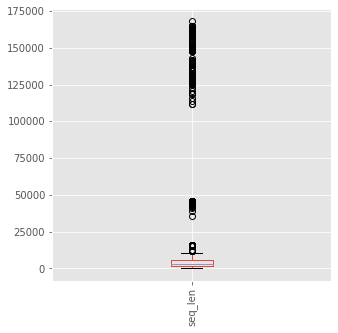

In [29]:
non_vir_df.seq_len.plot(kind='box', rot=90, figsize=(5,5))

In [146]:
# non_vir_df['bins'] = pd.qcut(non_vir_df['seq_len'].values, 10, labels=False)

In [147]:
# non_vir_df.bins.plot(kind='hist')

In [148]:
# non_vir_df.groupby(by='bins').agg({'seq_len': 'mean'})

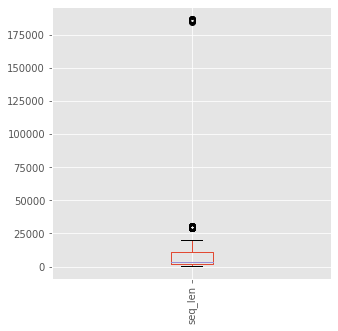

In [30]:
vir_df.seq_len.plot(kind='box', rot=90, figsize=(5,5))

In [150]:
# vir_df['bins'] = pd.qcut(vir_df['seq_len'].values, 10, labels=False)

In [151]:
# vir_df.bins.plot(kind='hist')

In [152]:
# vir_df.groupby(by='bins').agg({'seq_len': 'mean'})

In [33]:
len(vir_df.columns[vir_df.isnull().any()])

0

In [34]:
len(non_vir_df.columns[non_vir_df.isnull().any()])

0

## Sample and concatenate two dataframes

In [35]:
vir_df_sample = vir_df.sample(n=10000, weights='seq_len', random_state=42)
non_vir_df_sample = non_vir_df.sample(n=10000, weights='seq_len', random_state=42)

In [36]:
sample_df = pd.concat([vir_df_sample, non_vir_df_sample])
sample_df.reset_index(drop=True, inplace=True)

In [37]:
sample_df.head()

,seq_id,seq_name,seq_desc,seq_str,class,seq_len
0,KT749832.1,KT749832.1,KT749832.1 |Hepatitis B virus isolate FL10| co...,TTCCACTGCCTTCCACCAAGCTCTGCAGGATCCCAGAGTCAGGGGT...,virulent,3221
1,EF027134.1,EF027134.1,EF027134.1 |Chikungunya virus strain IND-06-AP...,GTAGCCTACCAGTTTCTTACTGCTCTACTCTGCAAAGCAAGAGATT...,virulent,11779
2,HQ332177.1,HQ332177.1,HQ332177.1 |Dengue virus 1 strain VE_61059_200...,AGTTGTTAGTCTACGTGGACCGACAAGAACAGTTTCGAATCGGAAG...,virulent,10735
3,KM677246.1,KM677246.1,KM677246.1 |Japanese encephalitis virus isolat...,AGAAGTTTATCTGTGTGAACTTCTTGACTTAGTATCGTTGAGAGGA...,virulent,10988
4,MT451602.1,MT451602.1,MT451602.1 |Severe acute respiratory syndrome ...,ACTTTCGATCTCTTGTAGATCTGTTCTCTAAACGAACTTTAAAATC...,virulent,29818


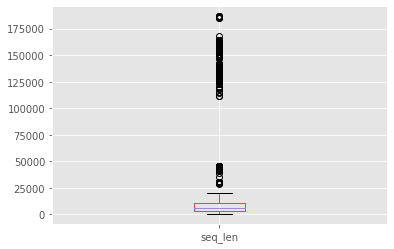

In [38]:
sample_df.seq_len.plot(kind='box')

In [39]:
merged_df = pd.concat([vir_df, non_vir_df])

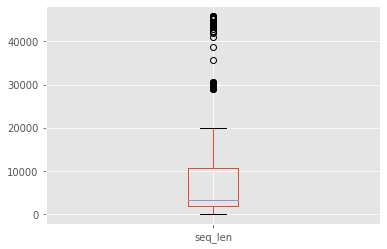

In [40]:
# filtered_df = filterOutliers(merged_df)
filtered_df = merged_df[merged_df.seq_len<=50000]
filtered_df.reset_index(drop=True, inplace=True)
filtered_df.seq_len.plot(kind='box')

In [41]:
filtered_df.head(20)

,seq_id,seq_name,seq_desc,seq_str,class,seq_len
0,MT577359.1,MT577359.1,MT577359.1 |Severe acute respiratory syndrome ...,CAACCAACTTTCGATCTCTTGTAGATCTGTTCTCTAAACGAACTTT...,virulent,29816
1,MT582456.1,MT582456.1,MT582456.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782
2,MT582458.1,MT582458.1,MT582458.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782
3,MT582459.1,MT582459.1,MT582459.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782
4,MT582460.1,MT582460.1,MT582460.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782
5,MT582462.1,MT582462.1,MT582462.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782
6,MT582463.1,MT582463.1,MT582463.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782
7,MT582466.1,MT582466.1,MT582466.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782
8,MT582467.1,MT582467.1,MT582467.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782
9,MT582468.1,MT582468.1,MT582468.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782


## Reconstruct common protein analysis

In [42]:
t1 = time.time()
filtered_df['p_seq'] = filtered_df['seq_str'].apply(lambda x: proteinTranslation(x))
print(f'Took {time.time() - t1} seconds to translate nucleotides to proteins')

C:\Users\Modak\anaconda3\lib\site-packages\Bio\Seq.py:2859: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


Took 180.65530610084534 seconds to translate nucleotides to proteins


C:\Users\Modak\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [43]:
filtered_df['gc_content'] = filtered_df['seq_str'].apply(lambda x: calcGcContent(x))

C:\Users\Modak\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [44]:
filtered_df.rename(columns={'p_seq': 'protein_sequence', 'seq_str': 'nucleotide_sequence'}, inplace=True)

C:\Users\Modak\anaconda3\lib\site-packages\pandas\core\frame.py:4133: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [45]:
filtered_df.head(10)

,seq_id,seq_name,seq_desc,nucleotide_sequence,class,seq_len,protein_sequence,gc_content
0,MT577359.1,MT577359.1,MT577359.1 |Severe acute respiratory syndrome ...,CAACCAACTTTCGATCTCTTGTAGATCTGTTCTCTAAACGAACTTT...,virulent,29816,QPTFDLL ICSLNEL NLCGCHSAACLVHSRSIINN LLSLTGHE ...,38.006
1,MT582456.1,MT582456.1,MT582456.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782,RSVL TNFKICVAVTRLHA CTHAV LITNYCR QDTSNSSIFCRL...,38.020
2,MT582458.1,MT582458.1,MT582458.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782,RSVL TNFKICVAVTRLHA CTHAV LITNYCR QDTSNSSIFCRL...,38.006
3,MT582459.1,MT582459.1,MT582459.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782,RSVL TNFKICVAVTRLHA CTHAV LITNYCR QDTSNSSIFCRL...,38.006
4,MT582460.1,MT582460.1,MT582460.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782,RSVL TNFKICVAVTRLHA CTHAV LITNYCR QDTSNSSIFCRL...,38.006
5,MT582462.1,MT582462.1,MT582462.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782,RSVL TNFKICVAVTRLHA CTHAV LITNYCR QDTSNSSIFCRL...,38.003
6,MT582463.1,MT582463.1,MT582463.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782,RSVL TNFKICVAVTRLHA CTHAV LITNYCR QDTSNSSIFCRL...,38.006
7,MT582466.1,MT582466.1,MT582466.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782,RSVL TNFKICVAVTRLHA CTHAV LITNYCR QDTSNSSIFCRL...,38.016
8,MT582467.1,MT582467.1,MT582467.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782,RSVL TNFKICVAVTRLHA CTHAV LITNYCR QDTSNSSIFCRL...,38.013
9,MT582468.1,MT582468.1,MT582468.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782,RSVL TNFKICVAVTRLHA CTHAV LITNYCR QDTSNSSIFCRL...,38.003


In [46]:
aa, mw, a, ii = np.apply_along_axis(proteinAnalysis, 0, filtered_df['protein_sequence'].values)
new_cols = ['amino_acid_percents','molecular_weights','aromaticity','instability_index']
filtered_df[new_cols] = pd.DataFrame({'amino_acid_percents': aa, 
                                      'molecular_weights': mw, 
                                      'aromaticity': a, 
                                      'instability_index': ii})

100%|██████████| 43995/43995 [08:53<00:00, 82.45it/s] 
C:\Users\Modak\anaconda3\lib\site-packages\pandas\core\frame.py:2963: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


In [47]:
filtered_df.head()

,seq_id,seq_name,seq_desc,nucleotide_sequence,class,seq_len,protein_sequence,gc_content,amino_acid_percents,molecular_weights,aromaticity,instability_index
0,MT577359.1,MT577359.1,MT577359.1 |Severe acute respiratory syndrome ...,CAACCAACTTTCGATCTCTTGTAGATCTGTTCTCTAAACGAACTTT...,virulent,29816,QPTFDLL ICSLNEL NLCGCHSAACLVHSRSIINN LLSLTGHE ...,38.006,"{'A': 0.0552571782689527, 'C': 0.0309853336087...",1.09139e+06,38.4863,0.0991531
1,MT582456.1,MT582456.1,MT582456.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782,RSVL TNFKICVAVTRLHA CTHAV LITNYCR QDTSNSSIFCRL...,38.020,"{'A': 0.04095227694659823, 'C': 0.069345855629...",1.06503e+06,43.9497,0.148302
2,MT582458.1,MT582458.1,MT582458.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782,RSVL TNFKICVAVTRLHA CTHAV LITNYCR QDTSNSSIFCRL...,38.006,"{'A': 0.04095227694659823, 'C': 0.069345855629...",1.06508e+06,43.9203,0.148411
3,MT582459.1,MT582459.1,MT582459.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782,RSVL TNFKICVAVTRLHA CTHAV LITNYCR QDTSNSSIFCRL...,38.006,"{'A': 0.04095227694659823, 'C': 0.069345855629...",1.06512e+06,43.9611,0.148411
4,MT582460.1,MT582460.1,MT582460.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782,RSVL TNFKICVAVTRLHA CTHAV LITNYCR QDTSNSSIFCRL...,38.006,"{'A': 0.04095227694659823, 'C': 0.069345855629...",1.06508e+06,43.9203,0.148411


In [48]:
filtered_df['seq_id'] = filtered_df['seq_id'].apply(lambda x: x.replace('.1', '').replace('.2', '').replace('.3', '').replace('.4', '').replace('.5', ''))

C:\Users\Modak\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [49]:
num_cols = ['molecular_weights', 'aromaticity', 'instability_index']
filtered_df[num_cols] = filtered_df[num_cols].astype('float')

C:\Users\Modak\anaconda3\lib\site-packages\pandas\core\frame.py:2963: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


In [50]:
filtered_df.describe()

,seq_len,gc_content,molecular_weights,aromaticity,instability_index
count,43995.000000,43995.000000,4.399500e+04,43995.000000,43995.000000
mean,6578.015797,44.970452,2.383864e+05,46.709825,0.094844
std,7718.174561,4.948916,2.778305e+05,8.210236,0.021981
min,20.000000,20.000000,5.707251e+02,-22.060000,0.000000
25%,1767.000000,41.704500,6.322091e+04,41.909057,0.079845
50%,3215.000000,45.491000,1.169483e+05,46.701320,0.092473
75%,10595.500000,48.613000,3.807375e+05,51.751067,0.106424
max,45781.000000,70.000000,1.649370e+06,117.800000,0.333333


In [51]:
filtered_df.set_index('seq_id', inplace=True)

In [52]:
amino_acids_percent_df = filtered_df['amino_acid_percents'].apply(pd.Series)
amino_acids_percent_df = amino_acids_percent_df.rename(columns = lambda x : 'amino_acid_' + str(x))


In [52]:
len(amino_acids_percent_df.columns[amino_acids_percent_df.isnull().any()])

0

In [53]:
amino_acids_percent_df.head(10)

,amino_acid_A,amino_acid_C,amino_acid_D,amino_acid_E,amino_acid_F,amino_acid_G,amino_acid_H,amino_acid_I,amino_acid_K,amino_acid_L,amino_acid_M,amino_acid_N,amino_acid_P,amino_acid_Q,amino_acid_R,amino_acid_S,amino_acid_T,amino_acid_V,amino_acid_W,amino_acid_Y
seq_id,,,,,,,,,,,,,,,,,,,,
MT577359,0.055257,0.030985,0.036563,0.038112,0.048234,0.048234,0.025615,0.058769,0.056290,0.128796,0.031915,0.052262,0.034497,0.042243,0.035736,0.072712,0.074055,0.078806,0.010122,0.040797
MT582456,0.040952,0.069346,0.031670,0.029486,0.064541,0.042918,0.036256,0.047286,0.043901,0.096429,0.012559,0.051436,0.031561,0.035274,0.060500,0.088239,0.074042,0.059845,0.028721,0.055040
MT582458,0.040952,0.069346,0.031670,0.029486,0.064650,0.042918,0.036366,0.047395,0.043901,0.096320,0.012559,0.051436,0.031561,0.035164,0.060500,0.088239,0.073933,0.059845,0.028721,0.055040
MT582459,0.040952,0.069346,0.031670,0.029486,0.064650,0.042809,0.036256,0.047395,0.043901,0.096320,0.012559,0.051436,0.031561,0.035274,0.060500,0.088239,0.074042,0.059845,0.028721,0.055040
MT582460,0.040952,0.069346,0.031670,0.029486,0.064650,0.042918,0.036366,0.047395,0.043901,0.096320,0.012559,0.051436,0.031561,0.035164,0.060500,0.088239,0.073933,0.059845,0.028721,0.055040
MT582462,0.040952,0.069346,0.031670,0.029486,0.064650,0.042918,0.036366,0.047505,0.043901,0.096320,0.012559,0.051436,0.031561,0.035164,0.060500,0.088129,0.073933,0.059845,0.028721,0.055040
MT582463,0.040952,0.069346,0.031670,0.029486,0.064650,0.042918,0.036366,0.047395,0.043901,0.096320,0.012559,0.051436,0.031561,0.035164,0.060500,0.088239,0.073933,0.059845,0.028721,0.055040
MT582466,0.041061,0.069346,0.031670,0.029486,0.064650,0.042918,0.036256,0.047395,0.043901,0.096320,0.012559,0.051436,0.031561,0.035274,0.060609,0.088239,0.073823,0.059845,0.028612,0.055040
MT582467,0.041061,0.069346,0.031670,0.029486,0.064759,0.042918,0.036256,0.047395,0.043901,0.096320,0.012559,0.051436,0.031561,0.035274,0.060609,0.088129,0.073823,0.059845,0.028612,0.055040


In [60]:
filtered_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 43995 entries, MT577359 to M90541
Data columns (total 11 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   seq_name             43995 non-null  object 
 1   seq_desc             43995 non-null  object 
 2   nucleotide_sequence  43995 non-null  object 
 3   class                43995 non-null  object 
 4   seq_len              43995 non-null  int64  
 5   protein_sequence     43995 non-null  object 
 6   gc_content           43995 non-null  float64
 7   amino_acid_percents  43995 non-null  object 
 8   molecular_weights    43995 non-null  float64
 9   aromaticity          43995 non-null  float64
 10  instability_index    43995 non-null  float64
dtypes: float64(4), int64(1), object(6)
memory usage: 5.3+ MB


In [55]:
merged_df = filtered_df.loc[:, filtered_df.columns != 'amino_acid_percents'].merge(amino_acids_percent_df, left_index=True, right_index=True)

In [87]:
merged_df.tail(10)

,seq_name,seq_desc,nucleotide_sequence,class,seq_len,protein_sequence,gc_content,molecular_weights,aromaticity,instability_index,...,amino_acid_M,amino_acid_N,amino_acid_P,amino_acid_Q,amino_acid_R,amino_acid_S,amino_acid_T,amino_acid_V,amino_acid_W,amino_acid_Y
seq_id,,,,,,,,,,,,,,,,,,,,,
J02058,J02058.1,J02058.1 |African cassava mosaic virus isolate...,CTCAACTGGAGACACACTTGAGCATCTCCTCCTATTAATTGGAGAC...,non-virulent,2724,LNWRHT ASPPINWRHYIGVSKGHSCNKLNFNFK KAQKAQNTQGA...,39.611,97519.9526,37.000626,0.134593,...,0.012987,0.056671,0.037780,0.031877,0.057851,0.059032,0.047226,0.079103,0.028335,0.056671
M90543,M90543.1,M90543.1 |Cauliflower mosaic virus| complete g...,GGTATCAGAGCCATGAATCGGTTTAAGACCAAAATTCAAGAGGGTA...,non-virulent,8033,GIRAMNRFKTKIQEGKTSSKYERVLNSKDKRSFKIEHSSLTPVTDR...,40.209,292242.0940,53.503749,0.070727,...,0.018075,0.053831,0.048330,0.049509,0.080157,0.101375,0.067583,0.042436,0.008251,0.029862
M93134,M93134.1,M93134.1 |Friend murine leukemia virus| comple...,GGGCCAGTCCTCCGACAGACTGAGTCGCCCGGGTACCCGTGTATCC...,non-virulent,8282,GPVLRQTESPGYPCIQ ILLLLHPTCGLAVPWEGLLRVIDYPSRGS...,53.357,301152.0698,45.423369,0.075194,...,0.010321,0.025065,0.105787,0.048286,0.067084,0.064136,0.073351,0.051972,0.019536,0.028750
M90542,M90542.1,M90542.1 |Cauliflower mosaic virus isolate BBC...,GGTATCAGAGCCATGAATCGGTTTAAAGACCAAATTCAAGAGGGTA...,non-virulent,8032,GIRAMNRFKDQIQEGKTSPINKRVLNSNDKRSFKINNSSLTPVTDR...,39.978,292238.6885,52.350618,0.074045,...,0.018905,0.056321,0.046869,0.048838,0.081134,0.099646,0.066955,0.039779,0.009059,0.030327
M92280,M92280.1,M92280.1 |Plum pox virus strain M isolate SK 6...,AAAATATAAAAACTCAACACAACATACAAAATTTTATGCAATCAAA...,non-virulent,9786,KI KLNTTYKILCNQINLKLSKFSKSHLKDQESTKNIPHIFYQIYC...,43.562,360363.4723,47.271553,0.082823,...,0.036416,0.031260,0.022881,0.066710,0.080567,0.102804,0.082501,0.052208,0.025137,0.019014
S46011,S46011.1,S46011.1 |polyprotein [raspberry ringspot viru...,TGTCTCAAATCTCAAGCTCATTATACGTGCTCTCTCTCTCTCTCTG...,non-virulent,3928,CLKSQAHYTCSLSLSGYVSCSDSKLVVHLNLSFW QIAKFACFLSI...,45.748,143595.8153,51.576074,0.086098,...,0.032385,0.030806,0.067930,0.034755,0.068720,0.098736,0.042654,0.074250,0.022907,0.023697
S48091,S48091.1,S48091.1 |NSM| glycoprotein precursor {M segme...,AGAGCAATCAGTGCATCAGAAATATACCTATTATACATTTTGCTAA...,non-virulent,4821,RAISASEIYLLYILLRINQLHYTSSSTLGC TRNVDSFR QEAF V...,35.677,175724.8744,45.165137,0.158317,...,0.009352,0.053440,0.023380,0.044088,0.065464,0.094856,0.051436,0.044756,0.016032,0.047428
S68010,S68010.1,S68010.1 |VP3=inner capsid protein {segment 3}...,GTTAAATTTCCAGAGCGATGGCGGAACCACCAGATGCAGCTACACC...,non-virulent,2768,VKFPERWRNHQMQLHLKQVHI REINCRATVAHYFQYSLYKK CKK...,42.630,102973.5343,60.293906,0.121176,...,0.038824,0.032941,0.035294,0.055294,0.120000,0.074118,0.045882,0.047059,0.034118,0.052941
J02482,J02482.1,J02482.1 |Coliphage phi-X174| complete genome,GAGTTTTATCGCTTCCATGACGCAGAAGTTAACACTTTCGGATATT...,non-virulent,5386,EFYRFHDAEVNTFGYF VEKLS SRNYYCLFTN IEVDCWRKMR...,44.764,196127.3722,52.900141,0.123899,...,0.025837,0.031709,0.052261,0.018203,0.077510,0.090429,0.052261,0.070464,0.032296,0.029947


In [57]:
len(merged_df.columns[merged_df.isnull().any()])

0

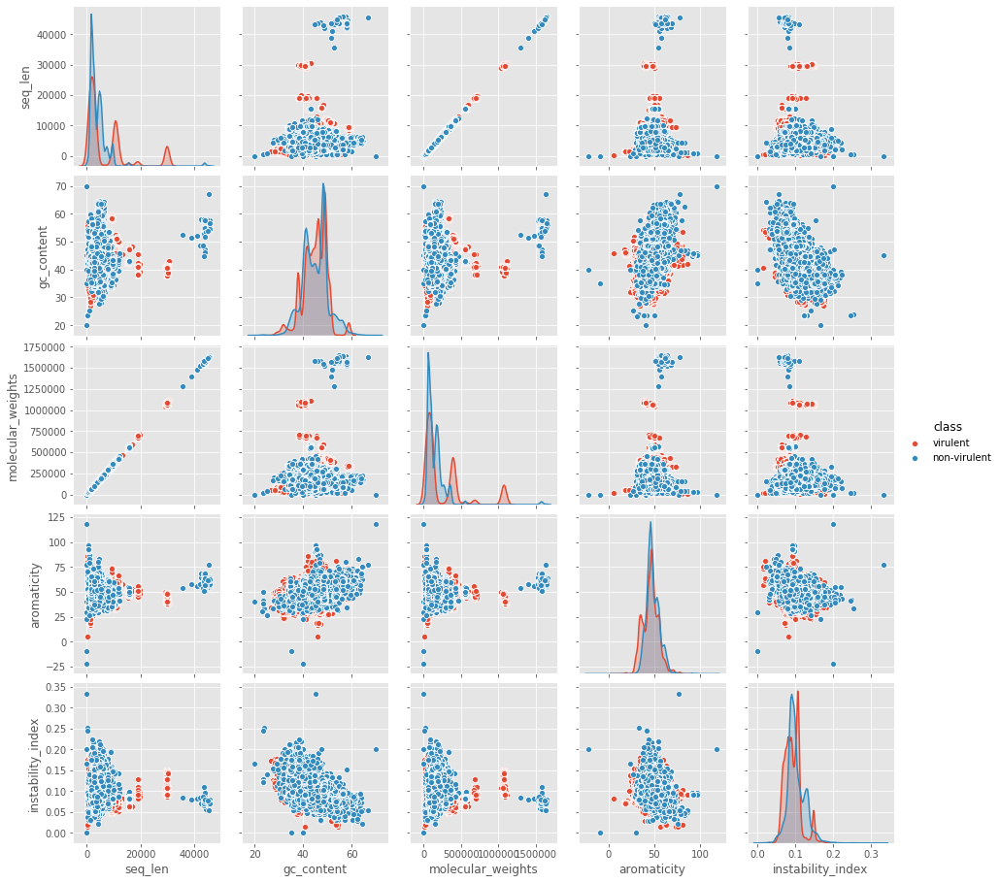

In [58]:
sns.pairplot(data=merged_df[['seq_len', 'gc_content', 'molecular_weights', 'aromaticity', 'instability_index', 'class']], hue='class')
plt.show()

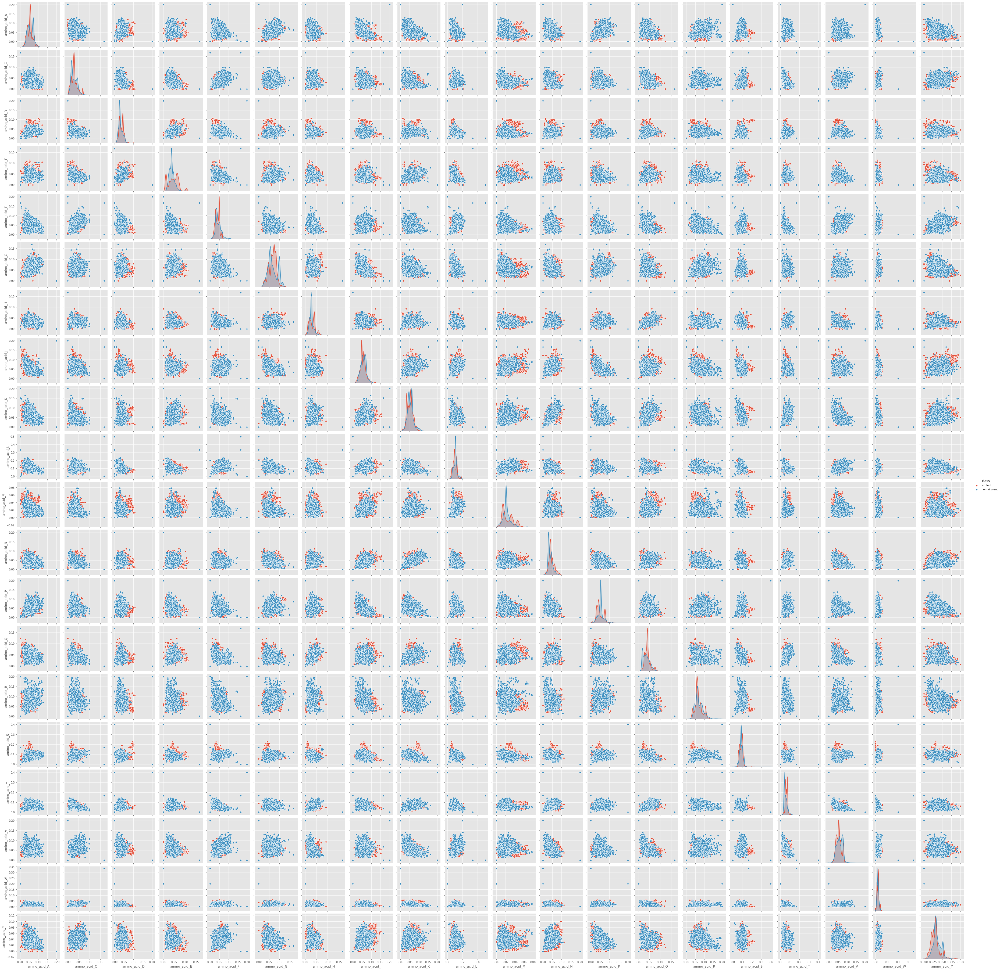

<Figure size 1440x1440 with 0 Axes>

In [62]:
#Takes time to execute
filter_cols = [col for col in merged_df if (col.startswith('amino_acid') or col == 'class')]
sns.pairplot(data=merged_df[filter_cols], hue='class')
plt.figure(figsize=(20,20))
plt.show()

In [63]:
filter_cols

['class',
 'amino_acid_A',
 'amino_acid_C',
 'amino_acid_D',
 'amino_acid_E',
 'amino_acid_F',
 'amino_acid_G',
 'amino_acid_H',
 'amino_acid_I',
 'amino_acid_K',
 'amino_acid_L',
 'amino_acid_M',
 'amino_acid_N',
 'amino_acid_P',
 'amino_acid_Q',
 'amino_acid_R',
 'amino_acid_S',
 'amino_acid_T',
 'amino_acid_V',
 'amino_acid_W',
 'amino_acid_Y']

In [64]:
amino_acids_percent_df.head(5)

,amino_acid_A,amino_acid_C,amino_acid_D,amino_acid_E,amino_acid_F,amino_acid_G,amino_acid_H,amino_acid_I,amino_acid_K,amino_acid_L,amino_acid_M,amino_acid_N,amino_acid_P,amino_acid_Q,amino_acid_R,amino_acid_S,amino_acid_T,amino_acid_V,amino_acid_W,amino_acid_Y
seq_id,,,,,,,,,,,,,,,,,,,,
MT577359,0.055257,0.030985,0.036563,0.038112,0.048234,0.048234,0.025615,0.058769,0.056290,0.128796,0.031915,0.052262,0.034497,0.042243,0.035736,0.072712,0.074055,0.078806,0.010122,0.040797
MT582456,0.040952,0.069346,0.031670,0.029486,0.064541,0.042918,0.036256,0.047286,0.043901,0.096429,0.012559,0.051436,0.031561,0.035274,0.060500,0.088239,0.074042,0.059845,0.028721,0.055040
MT582458,0.040952,0.069346,0.031670,0.029486,0.064650,0.042918,0.036366,0.047395,0.043901,0.096320,0.012559,0.051436,0.031561,0.035164,0.060500,0.088239,0.073933,0.059845,0.028721,0.055040
MT582459,0.040952,0.069346,0.031670,0.029486,0.064650,0.042809,0.036256,0.047395,0.043901,0.096320,0.012559,0.051436,0.031561,0.035274,0.060500,0.088239,0.074042,0.059845,0.028721,0.055040
MT582460,0.040952,0.069346,0.031670,0.029486,0.064650,0.042918,0.036366,0.047395,0.043901,0.096320,0.012559,0.051436,0.031561,0.035164,0.060500,0.088239,0.073933,0.059845,0.028721,0.055040


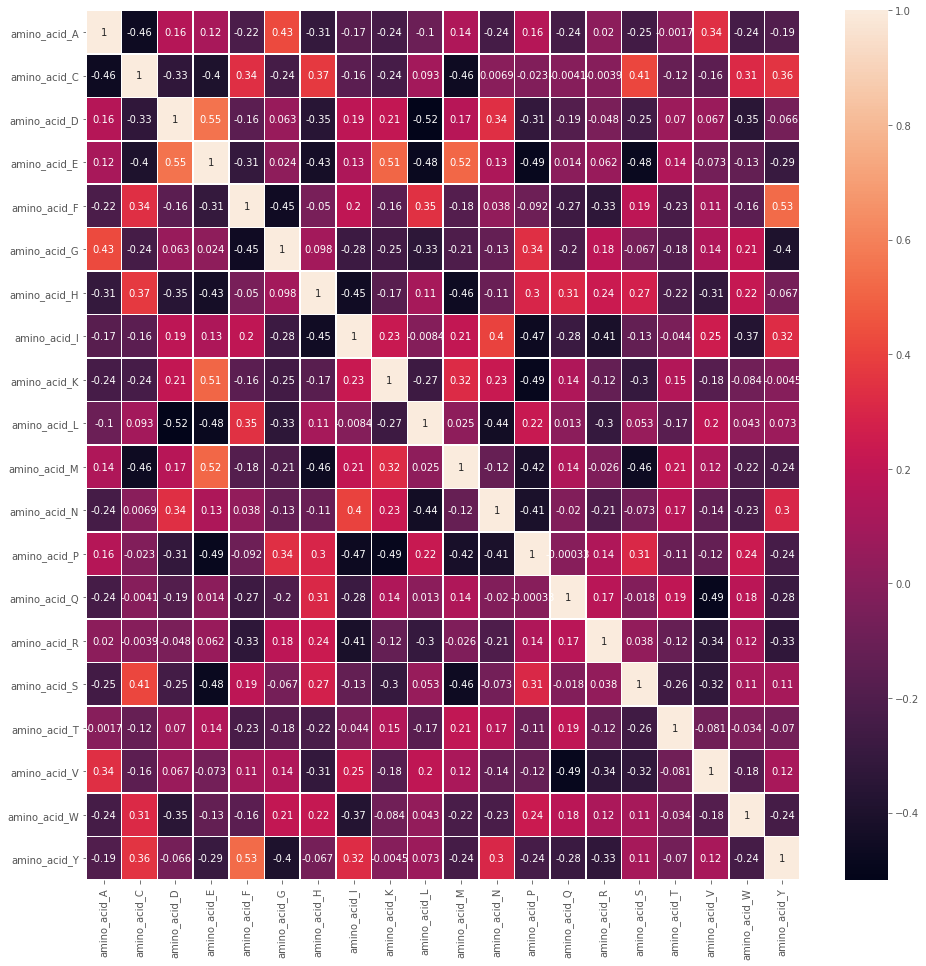

In [65]:
#Showing mutual information as heatmap with values
corr = amino_acids_percent_df.corr()
plt.figure(figsize = (16,16))
ax = sns.heatmap(corr,annot=True, linewidths=.5);

In [66]:
from sklearn.model_selection import train_test_split
#split dataset
y = merged_df["class"]
# All other columns will be used as features when training our model
X = merged_df.drop(["class"], axis=1)
# Split 70% of the data for training and leave out 30% for testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [88]:
merged_df.tail(10)

,seq_name,seq_desc,nucleotide_sequence,class,seq_len,protein_sequence,gc_content,molecular_weights,aromaticity,instability_index,...,amino_acid_M,amino_acid_N,amino_acid_P,amino_acid_Q,amino_acid_R,amino_acid_S,amino_acid_T,amino_acid_V,amino_acid_W,amino_acid_Y
seq_id,,,,,,,,,,,,,,,,,,,,,
J02058,J02058.1,J02058.1 |African cassava mosaic virus isolate...,CTCAACTGGAGACACACTTGAGCATCTCCTCCTATTAATTGGAGAC...,non-virulent,2724,LNWRHT ASPPINWRHYIGVSKGHSCNKLNFNFK KAQKAQNTQGA...,39.611,97519.9526,37.000626,0.134593,...,0.012987,0.056671,0.037780,0.031877,0.057851,0.059032,0.047226,0.079103,0.028335,0.056671
M90543,M90543.1,M90543.1 |Cauliflower mosaic virus| complete g...,GGTATCAGAGCCATGAATCGGTTTAAGACCAAAATTCAAGAGGGTA...,non-virulent,8033,GIRAMNRFKTKIQEGKTSSKYERVLNSKDKRSFKIEHSSLTPVTDR...,40.209,292242.0940,53.503749,0.070727,...,0.018075,0.053831,0.048330,0.049509,0.080157,0.101375,0.067583,0.042436,0.008251,0.029862
M93134,M93134.1,M93134.1 |Friend murine leukemia virus| comple...,GGGCCAGTCCTCCGACAGACTGAGTCGCCCGGGTACCCGTGTATCC...,non-virulent,8282,GPVLRQTESPGYPCIQ ILLLLHPTCGLAVPWEGLLRVIDYPSRGS...,53.357,301152.0698,45.423369,0.075194,...,0.010321,0.025065,0.105787,0.048286,0.067084,0.064136,0.073351,0.051972,0.019536,0.028750
M90542,M90542.1,M90542.1 |Cauliflower mosaic virus isolate BBC...,GGTATCAGAGCCATGAATCGGTTTAAAGACCAAATTCAAGAGGGTA...,non-virulent,8032,GIRAMNRFKDQIQEGKTSPINKRVLNSNDKRSFKINNSSLTPVTDR...,39.978,292238.6885,52.350618,0.074045,...,0.018905,0.056321,0.046869,0.048838,0.081134,0.099646,0.066955,0.039779,0.009059,0.030327
M92280,M92280.1,M92280.1 |Plum pox virus strain M isolate SK 6...,AAAATATAAAAACTCAACACAACATACAAAATTTTATGCAATCAAA...,non-virulent,9786,KI KLNTTYKILCNQINLKLSKFSKSHLKDQESTKNIPHIFYQIYC...,43.562,360363.4723,47.271553,0.082823,...,0.036416,0.031260,0.022881,0.066710,0.080567,0.102804,0.082501,0.052208,0.025137,0.019014
S46011,S46011.1,S46011.1 |polyprotein [raspberry ringspot viru...,TGTCTCAAATCTCAAGCTCATTATACGTGCTCTCTCTCTCTCTCTG...,non-virulent,3928,CLKSQAHYTCSLSLSGYVSCSDSKLVVHLNLSFW QIAKFACFLSI...,45.748,143595.8153,51.576074,0.086098,...,0.032385,0.030806,0.067930,0.034755,0.068720,0.098736,0.042654,0.074250,0.022907,0.023697
S48091,S48091.1,S48091.1 |NSM| glycoprotein precursor {M segme...,AGAGCAATCAGTGCATCAGAAATATACCTATTATACATTTTGCTAA...,non-virulent,4821,RAISASEIYLLYILLRINQLHYTSSSTLGC TRNVDSFR QEAF V...,35.677,175724.8744,45.165137,0.158317,...,0.009352,0.053440,0.023380,0.044088,0.065464,0.094856,0.051436,0.044756,0.016032,0.047428
S68010,S68010.1,S68010.1 |VP3=inner capsid protein {segment 3}...,GTTAAATTTCCAGAGCGATGGCGGAACCACCAGATGCAGCTACACC...,non-virulent,2768,VKFPERWRNHQMQLHLKQVHI REINCRATVAHYFQYSLYKK CKK...,42.630,102973.5343,60.293906,0.121176,...,0.038824,0.032941,0.035294,0.055294,0.120000,0.074118,0.045882,0.047059,0.034118,0.052941
J02482,J02482.1,J02482.1 |Coliphage phi-X174| complete genome,GAGTTTTATCGCTTCCATGACGCAGAAGTTAACACTTTCGGATATT...,non-virulent,5386,EFYRFHDAEVNTFGYF VEKLS SRNYYCLFTN IEVDCWRKMR...,44.764,196127.3722,52.900141,0.123899,...,0.025837,0.031709,0.052261,0.018203,0.077510,0.090429,0.052261,0.070464,0.032296,0.029947


In [67]:
X_train.head(10)

,seq_name,seq_desc,nucleotide_sequence,seq_len,protein_sequence,gc_content,molecular_weights,aromaticity,instability_index,amino_acid_A,...,amino_acid_M,amino_acid_N,amino_acid_P,amino_acid_Q,amino_acid_R,amino_acid_S,amino_acid_T,amino_acid_V,amino_acid_W,amino_acid_Y
seq_id,,,,,,,,,,,,,,,,,,,,,
FJ898464,FJ898464.1,FJ898464.1 |Dengue virus 3 isolate DENV-3/GY/B...,GACAAGAACAGTTTCGACTCGGAAGCTTGCTTAACGTAGTGCTAAC...,10663,DKNSFDSEACLT C QFFIREQISDEQPTEEDGKTVYQYAETREKP...,46.375,386335.0594,52.047296,0.076537,0.044031,...,0.016548,0.065603,0.041962,0.041076,0.107861,0.092790,0.057624,0.041667,0.026005,0.023936
JF706281,JF706281.1,JF706281.1 |Japanese encephalitis virus isolat...,AGAAGTTTATCTGTGTGAACTTCTTGGCTTAGTATCGTTGAGAAGA...,10965,RSLSV TSWLSIVEKNRKISAV TVF NGRTTMTKKPGGPGKNRAI...,51.856,402517.9198,33.972293,0.082120,0.081846,...,0.031035,0.035704,0.042845,0.027740,0.061796,0.059874,0.071134,0.082395,0.026916,0.023345
JX045969,JX045969.1,JX045969.1 |Influenza A virus (A/swine/Indiana...,ATGGATGTCAATCCGACTCTACTTTTCCTAAAGGTTCCAGCGCAAA...,2274,MDVNPTLLFLKVPAQNAISTTFPYTGDPPYSHGTGTGYTMDTVNRT...,42.304,86456.2288,41.538203,0.088507,0.052840,...,0.048877,0.063408,0.042272,0.040951,0.067371,0.070013,0.079260,0.046235,0.011889,0.033025
KX831480,KX831480.1,KX831480.1 |Porcine circovirus 2 isolate YiY-3...,ACCAGCGCACTTCGGCAGCGGCAGCACCTCGGCAGCACCTCAGCAG...,1767,TSALRQRQHLGSTSAATCPAKRMEEADPNHTKGGCSR IILPRTSA...,48.387,62338.1516,43.848348,0.089631,0.072056,...,0.021090,0.033392,0.052724,0.017575,0.061511,0.086116,0.042179,0.080844,0.021090,0.029877
KJ545440,KJ545440.1,KJ545440.1 |Dengue virus 4 isolate China/GD-D1...,CCTACGGAATGCGATGCGTAGGGGTAGGGAACAGAGACTTTGTGGA...,1517,PTECDA G GTETLWKESRVEHGSTWC NMEDASQPWPRENQPWIL...,45.485,53640.6414,53.173341,0.073753,0.036876,...,0.030369,0.028200,0.054230,0.067245,0.075922,0.073753,0.060738,0.043384,0.036876,0.013015
MH845344,MH845344.1,MH845344.1 |Epizootic hemorrhagic disease viru...,GTTAAAAAGGAGGCACGTTCTTGCATCATGGGCAAGATCATCAAGA...,1641,VKKEARSCIMGKIIKKLSKVGKKIGDALTSNTAQRIYKTIGKAAER...,45.826,61165.9438,44.102766,0.064103,0.102564,...,0.020147,0.023810,0.031136,0.047619,0.065934,0.053114,0.042125,0.056777,0.003663,0.031136
KC774197,KC774197.1,KC774197.1 |Hepatitis B virus isolate clz2035|...,CTCCACAACATTCCATCAAGCTCTGCTAGATCCCAGAGTGAGGGGC...,3215,LHNIPSSSARSQSEGPLFSCWWLQFRNSKPCSDYCLTHIVNLLEDW...,49.020,117546.9516,48.203718,0.108798,0.057711,...,0.016083,0.042573,0.076632,0.039735,0.057711,0.104068,0.053926,0.057711,0.026490,0.030274
EU939558,EU939558.1,EU939558.1 |Hepatitis B virus isolate C66| com...,TTCCACAACATTCCACCAAACGCTCCCTGCTGGTGGCTCCAGTTCC...,3185,FHNIPPNAPCWWLQFRNSKPCSDYCLTHIVNLIEDWGPCTEHGEHS...,49.294,116362.3280,47.605669,0.108987,0.059273,...,0.014340,0.043021,0.079350,0.038241,0.060229,0.102294,0.053537,0.054493,0.025813,0.031549
KM373995,KM373995.1,KM373995.1 |Influenza A virus (A/mallard/New J...,ATGGCGTCTCAAGGCACCAAACGATCCTATGAACAAATGGAAACTG...,1497,MASQGTKRSYEQMETGGERQNATEIRASVGRMVGGIGRFYIQMCTE...,47.695,56324.2248,45.132149,0.076305,0.078313,...,0.048193,0.054217,0.032129,0.044177,0.110442,0.076305,0.056225,0.044177,0.012048,0.028112


In [77]:
X_test.head(10)

,seq_name,seq_desc,nucleotide_sequence,seq_len,protein_sequence,gc_content,molecular_weights,aromaticity,instability_index,amino_acid_A,...,amino_acid_M,amino_acid_N,amino_acid_P,amino_acid_Q,amino_acid_R,amino_acid_S,amino_acid_T,amino_acid_V,amino_acid_W,amino_acid_Y
seq_id,,,,,,,,,,,,,,,,,,,,,
JN596938,JN596938.1,JN596938.1 |Influenza A virus (A/swine/Italy/4...,ATGGAGAGAATAAAAGAATTAAGGGATCTGATGTCGCAGTCTCGCA...,2291,MERIKELRDLMSQSRTREILTKTTVDHMAIIKKYTSGRQEKNPALR...,43.038,86193.5498,44.243045,0.065617,0.059055,...,0.043307,0.044619,0.036745,0.047244,0.080052,0.066929,0.070866,0.077428,0.013123,0.020997
MN233023,MN233023.1,MN233023.1 |Senecavirus A isolate CAN/07-50329...,GGGGGGCTGGGCCCTCATGCCCAGTCCTTCCTTTCCCCTTCCGGAG...,7304,GGLGPHAQSFLSPSGGLTGCVC RHRGATSNLLLRGTVRLRFLRRQ...,51.533,266865.1990,35.107498,0.098428,0.076510,...,0.020678,0.045906,0.069892,0.038048,0.050041,0.079818,0.070306,0.071133,0.012821,0.035153
KC762642,KC762642.1,KC762642.1 |Dengue virus 1 isolate MKS-WS88| c...,AGTTGTTAGTCTACGTGGACCGACAAGAACAGTTTCGAATCGGAAG...,10735,SC STWTDKNSFESEACLT F QFFIREQISDEQPTEKDGSTVFQY...,46.614,391770.4902,56.616210,0.069197,0.041460,...,0.018102,0.057226,0.047299,0.041460,0.109489,0.096058,0.060438,0.039416,0.026277,0.019562
MH622929,MH622929.2,MH622929.2 |Microviridae sp. isolate ctei769| ...,ATGCATCGCAATAAATCGGTAATGGTTCATCAATTCTCACGCGTGC...,4525,MHRNKSVMVHQFSRVPKAQIPRSSFDRSHGHKTTFDAGLLIPVFVD...,52.464,164309.0108,51.379014,0.068872,0.077650,...,0.020932,0.045240,0.076975,0.064821,0.070898,0.093180,0.091830,0.041864,0.008778,0.024983
EF210157,EF210157.2,EF210157.2 |Chikungunya virus strain DRDE-06| ...,ATGGCTGCGTGAGACACACGTAGCCTACCAGTTTCTTACTGCTCTA...,11774,MAA DTRSLPVSYCSTLQSKRLITHHGSCVRGHRR QRLFEGPATC...,50.204,423923.0353,55.161665,0.060101,0.064072,...,0.015091,0.041303,0.066984,0.047127,0.108552,0.074133,0.066190,0.064602,0.010061,0.032036
KJ598653,KJ598653.1,KJ598653.1 |UNVERIFIED: Hepatitis B virus isol...,TTCCACAACATTCCACCAAGCTCTGCTAGATCCCAGAGTGAGGGGC...,3197,FHNIPPSSARSQSEGPIFSCWWLQFRNSKPCSDYCLTHIVNLLEDW...,49.171,116600.8841,49.182869,0.107722,0.057197,...,0.014299,0.040991,0.079123,0.040038,0.057197,0.100095,0.057197,0.055291,0.021926,0.032412
KP739382,KP739382.1,KP739382.1 |Influenza A virus (A/chicken/Washi...,TCACTCACCGAGTGACATCCACATCATGGCGTCTCAAGGCACCAAA...,1524,SLTE HPHHGVSRHQTIL ANGNWWRTPECH NQSICWENGWWNRK...,47.638,55171.7606,64.972689,0.071429,0.046218,...,0.006303,0.054622,0.052521,0.058824,0.100840,0.096639,0.033613,0.023109,0.035714,0.012605
KR534251,KR534251.2,KR534251.2 |Rabies lyssavirus isolate RV2898| ...,ACGCTTAACAACAAAATCAGAGAAGAAGCAGAAAGCGTCAGTTGTA...,11923,TLNNKIREEAESVSCKTKM HPYNGCRQDCIQSQ SGGLFEA DYR...,45.467,418796.2265,54.944282,0.084027,0.030604,...,0.022819,0.027651,0.060403,0.043758,0.076242,0.113557,0.072483,0.043490,0.018792,0.028456
JQ319166,JQ319166.1,JQ319166.1 |Puumala virus strain PUUV/Konneves...,TAGTAGTAGACTCCTTGAAAAGCTACTACGAGAAAAACTGGAATGA...,1829,TP KATTRKTGMSDLTDIQEDITRHEQQLVVARQKLKDAERAV...,38.983,68139.1133,46.496667,0.095960,0.060606,...,0.035354,0.037037,0.045455,0.047138,0.062290,0.053872,0.063973,0.060606,0.008418,0.043771


In [124]:
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.feature_selection import SelectFromModel
X_train.shape  #(30796, 29)
X_train1= X_train[X_train.columns[~X_train.columns.isin(['seq_name','seq_desc','nucleotide_sequence','protein_sequence'])]]
clf = ExtraTreesClassifier(n_estimators=50)
clf = clf.fit(X_train1, y_train)
X_train1.shape
#clf.feature_importances_  
#model = SelectFromModel(clf, prefit=True)
#X_new = model.transform(X_train[X_train.columns[~X_train.columns.isin(['seq_name','seq_desc','nucleotide_sequence','protein_sequence'])]] )
#X_new.shape  

(30796, 25)

In [118]:
X_test1 = X_test[X_test.columns[~X_test.columns.isin(['seq_name','seq_desc','nucleotide_sequence','protein_sequence'])]]
score3= clf.score(X_test1, y_test)
score3

0.9987877869535571

In [119]:
print(X_test.iloc[1].values)
#print(X_test1.iloc[-1].values.reshape(1, -1))
print(y_test.iloc[1])

clf.predict(X_test1.iloc[1].values.reshape(1, -1))

['MN233023.1'
 'MN233023.1 |Senecavirus A isolate CAN/07-503297/2007| complete genome'
 'GGGGGGCTGGGCCCTCATGCCCAGTCCTTCCTTTCCCCTTCCGGAGGGTTAACCGGCTGTGTTTGCTAGAGGCACAGAGGGGCAACATCCAACCTGCTTTTGCGGGGAACGGTGCGGCTCCGATTCCTGCGTCGCCAAAGGTGTTAGCGCACCCAAACGGCGCATCTACCAATGCTATTGGTGTGGTCTGCGAGTTCTAGCCTACTCGTTTCTCCCCTATCCATTCACTCACTCACGAAAAGTGTGTTGTAACCACAAGATTTAGCCCCCGCACGAGATGTGCGATAACCGTAAGACTGACTCAAGCGCGGAAAGCGCTGTAACCACATGCTGTTAGTCCCTTTATGGCTGCAAGATGGCTATCCACCTCGGATCACTGAACTGGAGCTCGACCCTCCTTAGTAAGGGAACCGAGAGGCCTTCGTGCAACAAGCTCCGACACAGAGTCCACGTGATTGCTACCACCATGAGTACATGGTTCTCCCCTCTCGACCCAGGACTTCTTTTTGAATATCCACGGCTCGATCCAGAGGGTGGGGCATGATCCCCCTAGCATAGCGAGCTACAGCGGGAACTGTAGCTAGGCCTTAGCGTGCCTTGGATACTGCCTGATAGGGCGACGGCCTAGTCGTGTCGGTTCTATAGGTAGCACATACAAATATGCAGAACTCTCATTTTTCTTTCGATACAGCCTCTGGCACCTTTGAAGATGTAACCGGAACAAAAGTCAAGATCGTTGAATACCCCAGATCGGTGAACAATGGTGTTTACGATTCGTCCACTCATTTAGAGATACTGAACCTACAGGGTGAAATTGAAGTTTTAAGGTCTTTCAATGAATATCAAATTCGCGCCGCCAAACAACAACTCGGACTGGACATCGTGTACGAACTACAGGGTAATGTTCAGAC

array(['non-virulent'], dtype=object)

In [120]:
from sklearn.metrics import accuracy_score
X1 = X[X.columns[~X.columns.isin(['seq_name','seq_desc','nucleotide_sequence','protein_sequence'])]]
y_pred = clf.predict(X1)
print(accuracy_score(y, y_pred))

0.9996363223093533


In [121]:
from matplotlib.colors import ListedColormap

def plot_boundaries(X, y, clf, title=None):
    # Create color maps.
    cmap_light = ListedColormap(['#FFAAAA', '#AAFFAA', '#AAAAFF'])
    cmap_bold = ListedColormap(['#FF0000', '#00FF00', '#0000FF'])

    # Create a mesh of shape [x_min, m_max]x[y_min, y_max].
    h = .05  # step size in the mesh
    h = max(round(((X.max() - X.min()).max() / 1000) / h) * h, h)
    x_min, x_max = X.iloc[:, 0].min()-1, X.iloc[:, 0].max()+1
    y_min, y_max = X.iloc[:, 1].min()-1, X.iloc[:, 1].max()+1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))

    # Predict a class value for each point in the mesh.
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])

    # Use the predictions to create a color plot.
    Z = Z.reshape(xx.shape)
    plt.figure()
    plt.pcolormesh(xx, yy, Z, cmap=cmap_light)

    # Plot the training points.
    plt.scatter(X.iloc[:, 0], X.iloc[:, 1], c=y, cmap=cmap_bold)

    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.xlabel(X.columns[0])
    plt.ylabel(X.columns[1])
    if title is not None:
        plt.title(title)

    plt.show()

In [127]:
#plot_boundaries(X_train1, y_train, clf, title="Classifier")

### Import metadata for pathogenic and nonpathogenic sequences

In [194]:
vir_meta_df = pd.read_csv('pathogenic_sequences_table.csv')
non_vir_meta_df = pd.read_csv('non_pathogenic_sequences_table.csv')

In [203]:
vir_meta_df.set_index('Accession', inplace=True)
vir_meta_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 37465 entries, MT565495 to S50225
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Release_Date      37465 non-null  object
 1   Species           37465 non-null  object
 2   Genus             37445 non-null  object
 3   Family            37465 non-null  object
 4   Length            37465 non-null  int64 
 5   Nuc_Completeness  37465 non-null  object
 6   Geo_Location      35640 non-null  object
 7   Host              33229 non-null  object
 8   Isolation_Source  15258 non-null  object
 9   Collection_Date   33038 non-null  object
dtypes: int64(1), object(9)
memory usage: 3.1+ MB


In [204]:
non_vir_meta_df.set_index('Accession', inplace=True)
non_vir_meta_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11847 entries, MN734250 to M90541
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Release_Date      11847 non-null  object
 1   Species           11847 non-null  object
 2   Genus             9334 non-null   object
 3   Family            11847 non-null  object
 4   Length            11847 non-null  int64 
 5   Nuc_Completeness  11847 non-null  object
 6   Geo_Location      10676 non-null  object
 7   Host              8162 non-null   object
 8   Isolation_Source  2751 non-null   object
 9   Collection_Date   9498 non-null   object
dtypes: int64(1), object(9)
memory usage: 1018.1+ KB


In [223]:
meta_df = pd.concat([vir_meta_df, non_vir_meta_df])

In [224]:
filtered_df = filtered_df.merge(meta_df, how='left', left_index=True, right_index=True)

In [236]:
filtered_df.to_csv('virus_analysis.csv')

In [230]:
# clean_cols = [col for col in filtered_df.columns.tolist() if not col.__contains__('_x')]
# analysis_df = filtered_df[clean_cols].copy()
# clean_cols = [col.replace('_y', '') for col in clean_cols]
# analysis_df.columns = clean_cols
# analysis_df.head()

### Inspect feature distributions

In [3]:
analysis_df = pd.read_csv('virus_analysis.csv')

In [237]:
analysis_df.isnull().sum()

seq_name                   0
seq_desc                   0
nucleotide_sequence        0
class                      0
seq_len                    0
protein_sequence           0
gc_content                 0
amino_acid_percents        0
molecular_weights          0
aromaticity                0
instability_index          0
Release_Date               0
Species                    0
Genus                   2509
Family                     0
Length                     0
Nuc_Completeness           0
Geo_Location            2736
Host                    7294
Isolation_Source       27419
Collection_Date         6100
dtype: int64

In [238]:
analysis_df.drop('Isolation_Source', axis=1, inplace=True)

In [214]:
# filtered_df.dropna(inplace=True)

In [242]:
virus_names = analysis_df.Species.unique().tolist()

In [243]:
virus_names

['Severe acute respiratory syndrome-related coronavirus',
 'Rotavirus A',
 'Rabies lyssavirus',
 'Chikungunya virus',
 'Dengue virus',
 'Hepatitis B virus',
 'Puumala orthohantavirus',
 'West Nile virus',
 'Mumps rubulavirus',
 'Japanese encephalitis virus',
 'Influenza A virus',
 'Perch actinovirus',
 'Andes orthohantavirus',
 'Zika virus',
 'Zaire ebolavirus',
 'Hantaan orthohantavirus',
 'Marburg marburgvirus',
 'Middle East respiratory syndrome-related coronavirus',
 'Measles morbillivirus',
 'Domestic cat hepadnavirus',
 'Tula orthohantavirus',
 'Musk shrew hepatitis B virus',
 'Crowned shrew hepatitis B virus',
 'Bombali ebolavirus',
 'Tai Forest hepadnavirus',
 'Laibin mobatvirus',
 'Shrew hepatitis B virus',
 'Tibetan frog hepatitis B virus',
 'Bat rotavirus',
 'Bundibugyo ebolavirus',
 'Xuan son virus',
 'Rotavirus B',
 'Duck hepatitis B virus',
 'Reston ebolavirus',
 'Ash River virus',
 'Sudan ebolavirus',
 'Tai Forest ebolavirus',
 'Bat hepadnavirus',
 'Rotavirus G',
 'Goose

In [265]:
analysis_df['Species'] = analysis_df['Species'].apply(lambda x: x.lower())

In [244]:
virus_families = analysis_df.Family.unique().tolist()

In [245]:
analysis_df.Family.value_counts()

Orthomyxoviridae    10543
Flaviviridae         6779
Hepadnaviridae       6541
Coronaviridae        2997
Microviridae         2753
Circoviridae         2722
Reoviridae           1951
Geminiviridae        1455
Rhabdoviridae        1419
Paramyxoviridae      1370
Anelloviridae         947
Filoviridae           658
Hantaviridae          618
Togaviridae           543
Potyviridae           471
Secoviridae           449
Picornaviridae        323
Polyomaviridae        271
Tospoviridae          256
Bromoviridae          197
Parvoviridae          195
Dicistroviridae       120
Caulimoviridae        116
Adenoviridae          110
Birnaviridae           91
Retroviridae           37
Virgaviridae           34
Poxviridae             19
Baculoviridae           9
Herpesviridae           1
Name: Family, dtype: int64

In [250]:
pd.crosstab(analysis_df['Family'], analysis_df['class'])

class,non-virulent,virulent
Family,,
Adenoviridae,110,0
Anelloviridae,947,0
Baculoviridae,9,0
Birnaviridae,91,0
Bromoviridae,197,0
Caulimoviridae,116,0
Circoviridae,2722,0
Coronaviridae,0,2997
Dicistroviridae,120,0


In [262]:
def plotSequenceLenHistogram(df, bins, strain):
    df[(df['Species'].str.contains(strain))]['seq_len'].hist(bins=bins)
    plt.title(f'{strain} Protein Length Distribution')
    plt.show()

In [270]:
virus_names = ['ebola', 'hanta', 'severe acute respiratory', 'influenza', 'rabies', 'dengue', 'hepatitis', 'hepacivirus', 'rota', 'chikungunya', 'west nile', 'zika', 'measles', 'middle east']

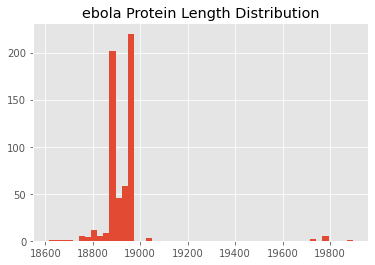

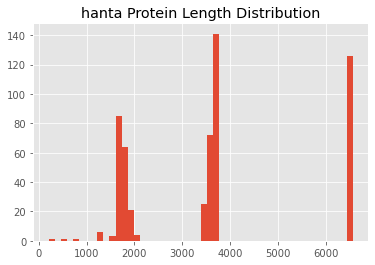

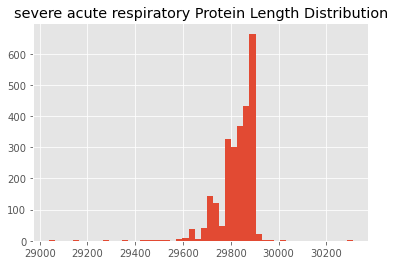

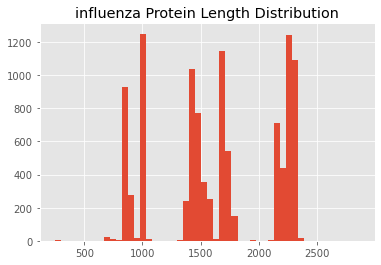

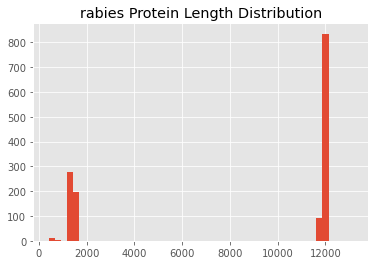

...

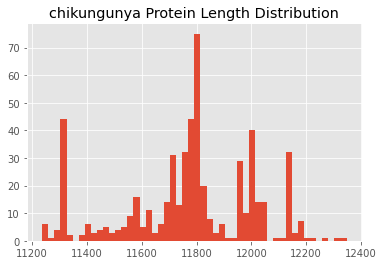

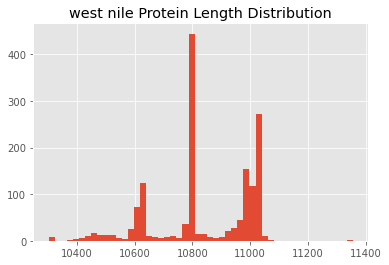

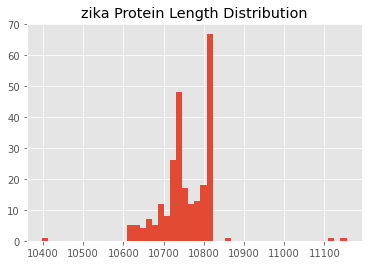

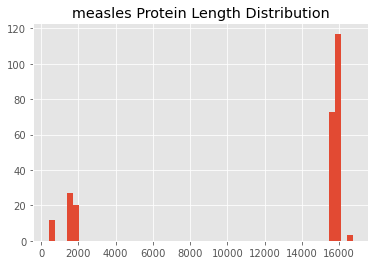

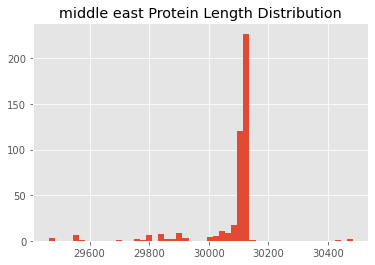

In [271]:
for name in virus_names:
    plotSequenceLenHistogram(analysis_df, 50, name)

In [272]:
analysis_df.describe()

,seq_len,gc_content,molecular_weights,aromaticity,instability_index,Length
count,43995.000000,43995.000000,4.399500e+04,43995.000000,43995.000000,43995.000000
mean,6578.015797,44.970452,3.016464e+05,45.963383,0.093918,6578.015797
std,7718.174561,4.948916,3.345605e+05,8.325980,0.022252,7718.174561
min,20.000000,20.000000,6.833177e+03,5.409630,0.014085,20.000000
25%,1767.000000,41.704500,6.342570e+04,40.203329,0.078313,1767.000000
50%,3215.000000,45.491000,1.173084e+05,46.208502,0.090909,3215.000000
75%,10595.500000,48.613000,3.979021e+05,50.942835,0.106341,10595.500000
max,45781.000000,70.000000,1.116475e+06,86.262727,0.187192,45781.000000


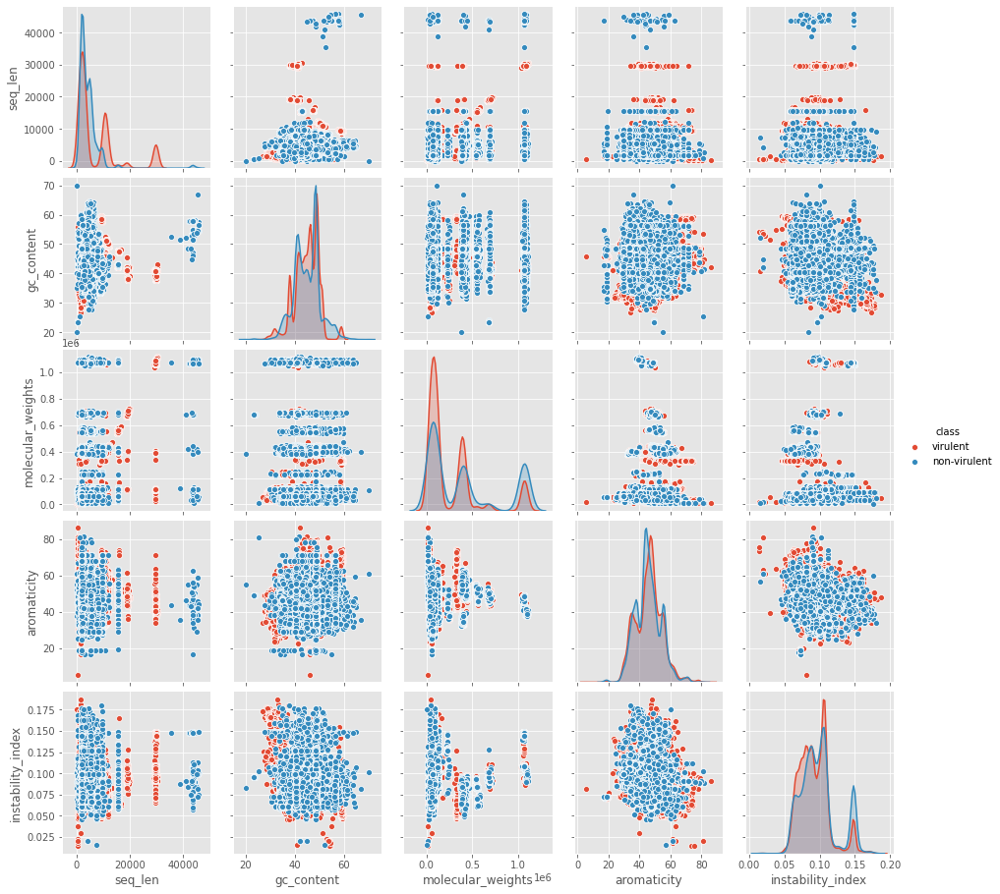

In [280]:
sns.pairplot(data=analysis_df[['seq_len', 'gc_content', 'molecular_weights', 'aromaticity', 'instability_index', 'class']], hue='class')
plt.show()

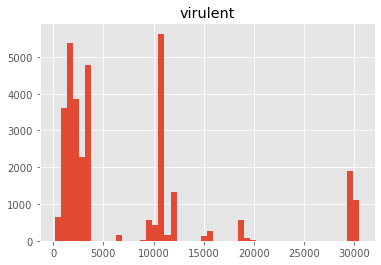

In [275]:
analysis_df[(analysis_df['class']=='virulent')].seq_len.hist(bins=50)
#  & (analysis_df['seq_desc'].str.contains('complete')) & (analysis_df['seq_len']>= 10000)
plt.title('virulent')
plt.show()

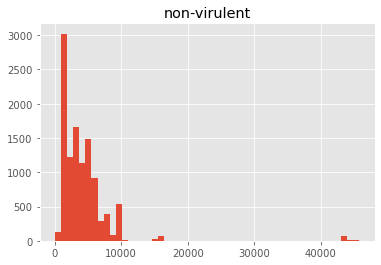

In [276]:
analysis_df[(analysis_df['class']=='non-virulent')].seq_len.hist(bins=50) 
#  & (analysis_df['seq_desc'].str.contains('complete')) & (analysis_df['seq_len'] <= 80000) & (analysis_df['seq_len']>= 10000)
plt.title('non-virulent')
plt.show()

In [96]:
# analysis_df = pd.concat([
#     filtered_df[(filtered_df['class']=='virulent') & (filtered_df['seq_desc'].str.contains('complete')) & (filtered_df['seq_len']>= 10000)],
#     filtered_df[(filtered_df['class']=='non-virulent') & (filtered_df['seq_desc'].str.contains('complete')) & (filtered_df['seq_len'] <= 80000) & (filtered_df['seq_len']>= 10000)]
# ])

## Build TFIDF vectors to proten similarity clustering

In [281]:
protein_corpus = analysis_df.protein_sequence.values

In [282]:
t1 = time.time()

vectorizer = TfidfVectorizer(ngram_range=(1, 10), 
                             analyzer='word', norm='l2', 
                             max_features=1000, lowercase=False,
                             min_df=.01, max_df=.90)
protein_vectors = vectorizer.fit_transform(protein_corpus)

t2 = time.time()

print(f'Took {t2-t1:.3} seconds to build TFIDF vector')

Took 93.5 seconds to build TFIDF vector


In [283]:
protein_vectors.shape

(43995, 1000)

In [284]:
vectorizer.get_feature_names()

['ACK',
 'ACK IFGFVC',
 'ACK IFGFVC LYHYWWS',
 'ACK IFGFVC LYHYWWS SLEFR',
 'AFS',
 'AFS QSC YNY',
 'AGCC',
 'AHAY',
 'AINSI',
 'AINSI VWY',
 'AINSI VWY LPR TFGIWCHFCCSST',
 'AINSI VWY LPR TFGIWCHFCCSST RRARRRLVR',
 'AIYN',
 'ARHL',
 'ASTILL',
 'ASTILL YQCTRRFCCL',
 'ASTILL YQCTRRFCCL KFTP',
 'ASTILL YQCTRRFCCL KFTP HTLCAHGWLYYSIS',
 'AVYKMAMVHLARFYSWLDCHSNGDNYALLYDQLL',
 'AWYIYLC',
 'AWYIYLC VHW',
 'AY',
 'CASY',
 'CC',
 'CCNNKDST',
 'CCNNKDST GW',
 'CCNNKDST GW NC',
 'CCNNKDST GW NC LVEAVN',
 'CCNRNCQQHSL',
 'CCP',
 'CCP STDT',
 'CCSRGCFNCCGYTY',
 'CCY',
 'CCY SL',
 'CCY SL ISIL',
 'CCYSV',
 'CCYSV WLSYFFF',
 'CCYSV WLSYFFF NT',
 'CCYSV WLSYFFF NT RTFY NHLTCWFL',
 'CCYSV WLSYFFF NT RTFY NHLTCWFL RLVLFWTIYTTRYRIS',
 'CCYSV WLSYFFF NT RTFY NHLTCWFL RLVLFWTIYTTRYRIS ER',
 'CE',
 'CE LHF',
 'CENYRSCRRHYT',
 'CENYRSCRRHYT TSK',
 'CFIRR',
 'CFRSSHFHVGSYNLCYF',
 'CFSCKHSKRN',
 'CFSCKHSKRN PPQ',
 'CFSCKHSKRN PPQ GCQEFK',
 'CFSNTCRLFNRG',
 'CGGY',
 'CGGY TLHTLF',
 'CGGY TLHTLF ERS IVT TYCLAC'

In [302]:
ids = analysis_df.reset_index().seq_id.values
classes = analysis_df['class'].values
species = analysis_df['Species'].values

num_cols = ['seq_len', 'gc_content', 'molecular_weights', 'aromaticity', 'instability_index']
numeric = analysis_df[num_cols].values

scaler = StandardScaler()
numeric_scaled = scaler.fit_transform(numeric)

vector_df = pd.DataFrame(protein_vectors.toarray())
vector_df['ids'] = ids
vector_df['class'] = classes
vector_df['species'] = species
vector_df[num_cols] = pd.DataFrame(numeric_scaled)

vector_df.set_index('ids', inplace=True)
vector_df.to_csv('analysis_vectors.csv')

## Cluster and Visualize COVID strains

### Clustering using Kmeans (optional)

In [117]:
ssd = []

for i in range(1, 10):
    print(f'Building kmeans with {i+1} clusters')
    kmeans = KMeans(n_clusters=i+1)
    kmeans.fit(protein_vectors)
    ssd.append(kmeans.inertia_)

Building kmeans with 2 clusters
Building kmeans with 3 clusters
Building kmeans with 4 clusters
Building kmeans with 5 clusters
Building kmeans with 6 clusters
Building kmeans with 7 clusters
Building kmeans with 8 clusters
Building kmeans with 9 clusters
Building kmeans with 10 clusters


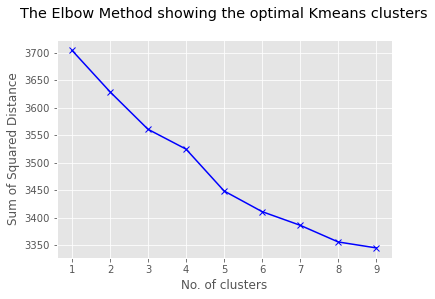

In [118]:
#Plotting to find the number of clusters
plt.plot(range(1,10), ssd,'bx-')
plt.xlabel("No. of clusters")
plt.ylabel("Sum of Squared Distance") #sum of squares within clusters
plt.title("The Elbow Method showing the optimal Kmeans clusters\n")
plt.show()

In [123]:
kmeans = KMeans(n_clusters=10)
kmeans.fit(protein_vectors)

KMeans(n_clusters=10)

In [124]:
vector_df['cluster'] = kmeans.predict(protein_vectors)

### Dimensionality reduction using SVD

In [308]:
protein_vectors.toarray().shape

(43995, 1000)

In [309]:
vector_df[num_cols].values.shape

(43995, 5)

In [316]:
# svd_features = np.concatenate((protein_vectors.toarray(), vector_df[num_cols].values), axis=1) # with numeric features
svd_features = protein_vectors.toarray() # without numeric features

In [317]:
svd = TruncatedSVD(n_components=2, random_state=42)
svd_matrix = svd.fit_transform(svd_features)

In [318]:
vector_df['svd_1'] = svd_matrix[:, 0]
vector_df['svd_2'] = svd_matrix[:, 1]

In [319]:
vector_df[['svd_1', 'svd_2', 'species', 'class']]

,svd_1,svd_2,species,class
ids,,,,
MT577359,0.040751,0.010176,severe acute respiratory syndrome-related coro...,virulent
MT582456,0.028003,0.006927,severe acute respiratory syndrome-related coro...,virulent
MT582458,0.028003,0.006927,severe acute respiratory syndrome-related coro...,virulent
MT582459,0.028003,0.006927,severe acute respiratory syndrome-related coro...,virulent
MT582460,0.028003,0.006927,severe acute respiratory syndrome-related coro...,virulent
...,...,...,...,...
S46011,-0.000000,-0.000000,raspberry ringspot virus,non-virulent
S48091,0.049169,0.003209,tomato spotted wilt tospovirus,non-virulent
S68010,0.018971,0.004809,epizootic hemorrhagic disease virus,non-virulent


In [320]:
vector_df.shape[0]

43995

In [321]:
import plotly.express as px
fig = px.scatter(vector_df.reset_index(), x="svd_1", y="svd_2", color="class", opacity=.25,
                 hover_data=['class', 'ids', 'species'], color_continuous_scale=px.colors.sequential.Viridis)
fig.show()